***Описание проекта***

В нашем распоряжении есть открытые данные о заведениях общественного питания в Москве, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года.

***Цель исследования***

Провести исследование рынка общественного питания Москвы с целью выявления ключевых особенностей и тенденций, которые помогут инвесторам выбрать оптимальное место, категорию заведения и ценовую политику для открытия нового заведения.

[Презентация](https://docs.google.com/presentation/d/1t_A07Fy_OVwN6qrcZ06ji4QA5MU2-WkBO3MAdtcdRSQ/edit#slide=id.p)


**Ход работы:**

- [1. Обзор данных](#Обзор_данных)
- [2. Предобработка данных](#Предобработка_данных)
  - [удаление аномальных значений](#аномалии)
  - [добавление новых колонок](#колонки)
  - [удаление дубликатов](#дубликаты)      
- [3. Исследовательский анализ данных](#Анализ_данных)      
  - [анализ категорий заведений](#категории_заведений)         
  - [анализ количества посадочных мест по категориям](#количество_мест)     
  - [соотношение сетевых и несетевых заведений](#сетевых_несетевых)        
  - [анализ наиболее распространённых сетевых заведений](#сетевые)  
  - [анализ районов и распределение заведений по районам](#районы)
  - [средний рейтинг по категориям заведений](#рейтинг)
  - [построение фоновой картограммы](#фоновую)      
  - [анализ среднего чека по районам](#чек)           
  - [соотношение заведений по рейтингу](#зависимости_от_рейтинга)  
  - [сравнение среднего чека](#средний_чек)     
- [4. Детализированный анализ кофеен](#открытие_кофейни)      
  - [распределение кофеен на карте](#распределение)     
  - [анализ круглосуточных кофеен](#круглосуточные)       
  - [рейтинг кофеен по районам](#рейтинг_кофеен)   
  - [анализ стоимости чашки капучино](#стоимость_кофе)      
- [5. Выводы](#Вывод) 


**Описание данных:**
- **name** — название заведения
- **address** — адрес
- **category** — категория (например, «кафе», «пиццерия»)
- **hours** — дни и часы работы
- **lat** — широта
- **lng** — долгота
- **rating** — рейтинг (до 5.0)
- **price** — категория цен (например, «средние»)
- **avg_bill** — средняя стоимость заказа (диапазон)
- **middle_avg_bill** — медиана среднего чека
- **middle_coffee_cup** — медиана цены капучино
- **chain** — сетевое заведение (0 - нет, 1 - да)
- **district** — административный район
- **seats** — количество мест


<a name="Обзор_данных"></a>

# 1. Обзор данных

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from plotly import graph_objects as go 
from numpy import median, mean
import plotly.express as px

from folium import Map, Choropleth, Marker
from folium.plugins import MarkerCluster

In [2]:
try:
    data , state_geo = (pd.read_csv('/datasets/moscow_places.csv'),
                        '/datasets/admin_level_geomap.geojson')
except:
    data, state_geo = (pd.read_csv('moscow_places.csv'),
                       'admin_level_geomap.geojson')
    

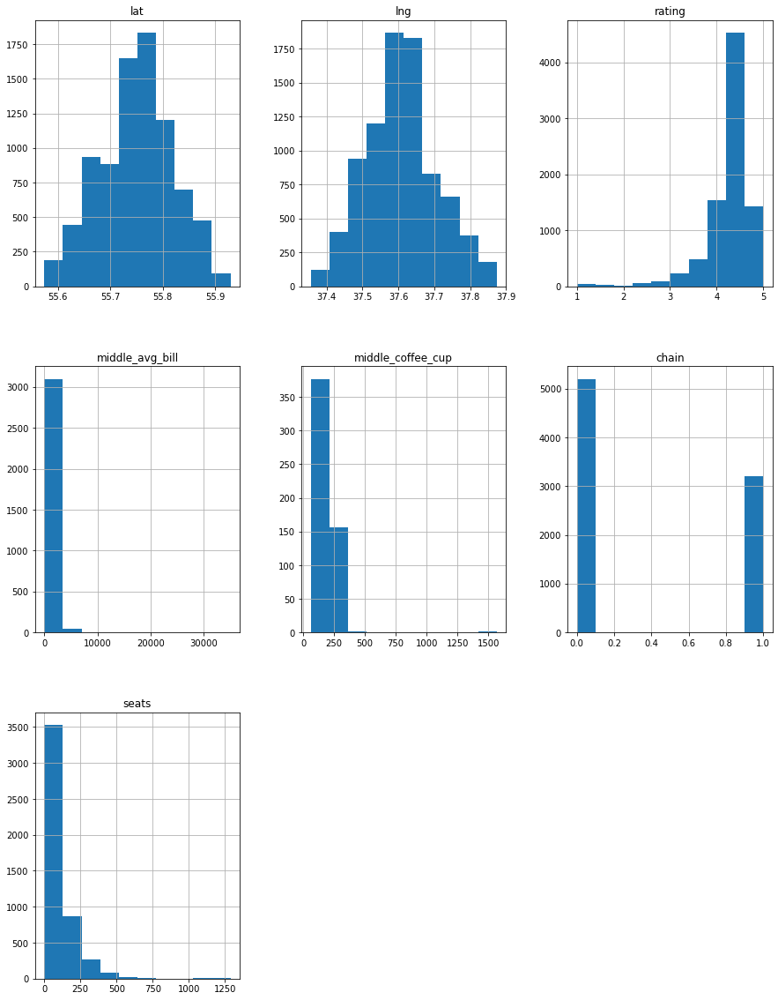

In [3]:
data.hist(figsize=(15, 20));

<a name="Предобработка_данных"></a>
# 2. Предобработка данных

In [4]:
for i in [data]:
    display(i.head(5))
    display(i.info())
    print('Дубликатов:' , i.duplicated().sum())

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


None

Дубликатов: 0


In [5]:
data[['seats', 'middle_coffee_cup', 'rating', 'middle_avg_bill']].describe()

,seats,middle_coffee_cup,rating,middle_avg_bill
count,4795.000000,535.000000,8406.000000,3149.000000
mean,108.421689,174.721495,4.229895,958.053668
std,122.833396,88.951103,0.470348,1009.732845
min,0.000000,60.000000,1.000000,0.000000
25%,40.000000,124.500000,4.100000,375.000000
50%,75.000000,169.000000,4.300000,750.000000
75%,140.000000,225.000000,4.400000,1250.000000
max,1288.000000,1568.000000,5.000000,35000.000000


<a name="аномалии"></a>

**Есть одно аномальное значение в 'middle_coffee_cup', связано с ошибкой при заполнении поля 'middle_avg_bill', исправим**

In [6]:
data.loc[(~data['middle_coffee_cup'].isna()) & (data['middle_coffee_cup'] > 400), 'middle_coffee_cup'] = 156

In [7]:
data[data['middle_avg_bill'] > 10000].head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
730,Чойхона,"бар,паб","Москва, Дмитровское шоссе, 95А",Северный административный округ,"ежедневно, 10:00–23:00",55.871497,37.543555,4.4,высокие,Средний счёт:5000–17000 ₽,11000.0,NaN,0,49.0
7177,Кафе,ресторан,"Москва, Каширское шоссе, 23, стр. 2",Южный административный округ,"ежедневно, круглосуточно",55.657450,37.646665,4.1,высокие,Средний счёт:20000–50000 ₽,35000.0,NaN,0,100.0


**Удалим 2 аномальных значения с 'middle_avg_bill'. Чайхона и кафе в больницы - цены не вызывают доверия**

In [8]:
data = data.drop (index= [7177, 730] )

In [9]:
data[data['seats'] > 300].head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
127,Арарат,кафе,"Москва, Дмитровское шоссе, 165, корп. 1",Северо-Восточный административный округ,"ежедневно, 06:00–20:00",55.914310,37.538953,4.2,NaN,NaN,NaN,NaN,1,350.0
171,One Price Coffee,кофейня,"Москва, Дмитровское шоссе, 163А, корп. 1",Северо-Восточный административный округ,"ежедневно, 10:00–22:00",55.909838,37.541526,4.0,NaN,NaN,NaN,NaN,1,350.0
176,Вуди пицца,пиццерия,"Москва, Дмитровское шоссе, 107А, корп. 1",Северный административный округ,"пн-пт 08:00–21:00; сб,вс 09:00–21:00",55.878504,37.540110,4.0,средние,Средний счёт:400–600 ₽,500.0,NaN,0,350.0
194,Ленкорань,кафе,"Москва, Дмитровское шоссе, 165, корп. 1",Северо-Восточный административный округ,"ежедневно, 06:00–20:00",55.914574,37.539103,1.4,NaN,NaN,NaN,NaN,0,350.0
216,Грузинский бульвар,быстрое питание,"Москва, Дмитровское шоссе, 163А, корп. 1",Северо-Восточный административный округ,"ежедневно, 10:00–22:00",55.909115,37.540112,4.0,NaN,NaN,NaN,NaN,0,350.0


Вероятно, аномальное кол-во посадочных мест связано с тем, что если заведение в фудкорте - указывается общее кол-во мест. Также есть заведения не находящиеся в фудкортах, большое кол-во мест может быть связано как с размером заведения так и с человеческим фактором, пока оставим как есть.

<a name="колонки"></a>
**Добавим колонку с названиями улиц, на которых находятся заведения**

In [10]:
data['street'] = data['address'].str.split(',').str[1]

**Создадим столбец is_24/7 с обозначением, что заведение работает ежедневно и круглосуточно**

In [11]:
data['is_24/7'] = data['hours'] == 'ежедневно, круглосуточно'

In [12]:
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко,False
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко,False
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица,False
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко,False
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица,False


**Разделим рейтинги по категориям**

In [13]:
def chain_category(index):
    if index['rating'] <= 3.5:
        return 'мусорный'
    elif index['rating'] <= 4:
        return 'низкий'
    elif index['rating'] <= 4.5:
        return 'средний'
    else:
        return 'высокий'
data['chain_category'] = data.apply(chain_category, axis= 1)

<a name="дубликаты"></a>
**Удалим дубликаты**

In [14]:
data['name'] = data['name'].str.lower()

data = data.drop_duplicates(subset=['name', 'address'])

<a name="Анадиз_данных"></a>
#  3. Исследовательский анализданных

<a name="категории_заведений"></a>
**Посмотрим какие категории заведений предоставленны в данных**

In [15]:
data_category = data['category'].value_counts().reset_index()
data_category['%'] = data_category['category'] / data['category'].count()*100
data_category.columns = ['категория', 'общее_кол-во', '%']

fig = px.bar(data_category, 
       y='категория', 
       x='общее_кол-во', 
       color='категория', 
       text=data_category['%'].apply(lambda x: ('{0:1.2f}%').format(x)),
       color_discrete_sequence=px.colors.sequential.Pinkyl,
            title= 'Распределение заведений по категориям')


fig.update_xaxes(title_text='Кол-во')
fig.update_yaxes(title_text='Категория заведения')

fig.show() 

Рестораны, кафе и кофейни занимают практически 70% рынка

<a name="Кол-во_мест"></a>
**Посмотрим как отличаются кол-во посадочных мест в зависимости от категории заведения**

In [16]:
data_seats = data.groupby('category')['seats'].median().reset_index().sort_values(by='seats', ascending =False)


fig = px.bar(data_seats,
             y='seats',
             x='category',
             text_auto=True, 
             color_discrete_sequence=['#85CDFD'],
             title = 'Среднее количество посадочных мест в зависимости от категории заведения')




fig.update_xaxes(title_text='Категория заведения')
fig.update_yaxes(title_text='Кол-во мест')

Наибольшее количество посадочных мест в ресторанах и бараха, меньшее мест предоставляют заведения быстрого питания: столовые, пицерии, булочные, кафе.

<a name="сетевых_несетевых"></a>
**Посмотрим соотношение сетевых и несетевых заведений**

In [17]:
fig = go.Figure(data=[go.Pie(labels=['Сетевые', 'Не сететевые'], 
                             values=data['chain'].value_counts().sort_values(ascending=True))])

fig.update_layout(
    title="Соотношение сетевых и несетевых заведений",
    title_x = 0.5,
    margin=dict(l=0, r=0, t=30, b=0))
fig.show()

Посмотрим с разбивкой по котегориям

In [18]:
# посчитаем кол-во сетевых и несетевых заведений
data_chain = data.pivot_table(index='chain', columns='category', values='district', aggfunc='count').T.reset_index()
data_chain.columns = ['категория', 'несетевой', 'сетевой']

# соеденим таблицу с общим числом заведений с таблицой с разбивкой
data_category1 = data_category.merge(data_chain, on='категория', how = 'left' )

# посчитаем % соотношение
data_category1['несетевые_%'] = round(data_category1['несетевой'] / data_category1['общее_кол-во'] * 100,2)
data_category1['сетевые_%'] = round(data_category1['сетевой'] / data_category1['общее_кол-во'] * 100,2)

In [19]:
data_category1

,категория,общее_кол-во,%,несетевой,сетевой,несетевые_%,сетевые_%
0,кафе,2377,28.294251,1598,779,67.23,32.77
1,ресторан,2041,24.294727,1312,729,64.28,35.72
2,кофейня,1413,16.819426,693,720,49.04,50.96
3,"бар,паб",763,9.082252,595,168,77.98,22.02
4,пиццерия,633,7.534817,303,330,47.87,52.13
5,быстрое питание,603,7.177717,371,232,61.53,38.47
6,столовая,315,3.749554,227,88,72.06,27.94
7,булочная,256,3.047256,99,157,38.67,61.33


In [20]:
fig = px.bar(data_category1, 
             y='категория', 
             x=['несетевой', 'сетевой'],
             text_auto=True,
             color_discrete_sequence=px.colors.sequential.Pinkyl,
             title= 'Соотношение сетевых и несетевых заведений')


fig.update_xaxes(title_text='Кол-во')
fig.update_yaxes(title_text='Категория заведения')
fig.update_layout(yaxis={'categoryorder':'total ascending'})

fig.show() 

5201 несетевых заведений, против 3205 сетевых заведений. Чаще всего, сетевики отдают предпочтение булочным, пицериям, кофейням. Заведениям с быстрой проходимостью.

<a name="сетевые"></a>
**Найдем наиболее распространенные сетевые заведения**

In [21]:
data_top = (data[data['chain'] == 1]
            .groupby('name', as_index = False).agg({'category' : 'max', 
                                                    'district' : 'count', 
                                                    'seats' : 'median',
                                                    'rating' : 'median',
                                                    'middle_avg_bill': 'median',
                                                    'middle_coffee_cup' : 'median'})
            .sort_values(by='district', ascending = False).head(15))

data_top.head()

,name,category,district,seats,rating,middle_avg_bill,middle_coffee_cup
729,шоколадница,кофейня,120,96.0,4.2,650.0,256.0
335,домино'с пицца,пиццерия,76,40.0,4.2,500.0,NaN
331,додо пицца,пиццерия,74,52.0,4.3,391.5,NaN
146,one price coffee,кофейня,71,99.5,4.2,NaN,80.0
742,яндекс лавка,ресторан,69,46.0,4.0,NaN,NaN


In [22]:
fig = px.bar(data_top, 
             y='name', 
             x='district',
             text_auto=True,
             color_discrete_sequence=px.colors.sequential.Pinkyl,
             title= 'ТОП 15 сетевых заведений по кол-ву точек',
             color = 'category')


fig.update_xaxes(title_text='Кол-во')
fig.update_yaxes(title_text='Название сети')
fig.update_layout(yaxis={'categoryorder':'total ascending'})

fig.show() 

Все заведения из ТОПа можем отнести к заведениям быстрого питания или заказа на вынос, с относительно не дорогим средним чеком.

Лидерами, как по числу сетей, так и по кол-ву точек являются кофейни.
По кол-ву сетей на втором месте рестораны, а по кол-ву сетей пицерии.

In [23]:
data_top.groupby('category')['district'].sum()

category
кафе         39
кофейня     362
пиццерия    150
ресторан    194
столовая     71
Name: district, dtype: int64

<a name="районы"></a>
**Посмотрим какие административные районы присутсвуют в датасете и распределение заведений по ним**

In [24]:
#Посчитаем кол-во завений покатегориям
data_dist = data.groupby(['district', 'category']).agg(count = ('category', 'count')).reset_index()

#Посчитаем общее кол-во заведений
data_dist1 = data.groupby('district').agg(count = ('name', 'count'))

#Обьеденим таблицы
data_dist2 = data_dist.merge(data_dist1, on = 'district', how='right')

data_dist2['share'] = round(data_dist2['count_x'] / data_dist2['count_y']* 100, 2)
data_dist2.columns = ['district', 'category', 'count1', 'count2', 'share']


data_dist2 = data_dist2.sort_values(['count2', 'district', 'count1'], ascending = False)
data_dist2.head()

,district,category,count1,count2,share
46,Центральный административный округ,ресторан,670,2242,29.88
43,Центральный административный округ,кафе,464,2242,20.70
44,Центральный административный округ,кофейня,428,2242,19.09
40,Центральный административный округ,"бар,паб",364,2242,16.24
45,Центральный административный округ,пиццерия,113,2242,5.04


In [25]:
fig = px.bar(data_dist2,
             x='district',
             y='count1',
             title='Распределение заведений по округам', 
             color='category',
             color_discrete_sequence=px.colors.sequential.Pinkyl)

fig.update_layout(
    width=1000,
    height=800
)

fig.update_xaxes(tickangle=45)
fig.update_xaxes(title_text='Район')
fig.update_yaxes(title_text='Количество заведений')

fig.show() 

In [26]:
fig = px.bar(data_dist2, 
             x='district', 
             y='share', 
             color='category', 
             text=data_dist2['share'].apply(lambda x: '{0:1.2f}%'.format(x)),
             color_discrete_sequence=px.colors.sequential.Pinkyl)


fig.update_layout(width=1000, height=1000)

fig.update_xaxes(tickangle=45)
fig.update_xaxes(title_text='Район')
fig.update_yaxes(title_text='Процентное соотношение')

fig.show() 



Везде лидирую кафе, кофейни и рестораны, также можем отметить, что в ЦАО довольно много баров, по сравнению с другими округами.

<a name="рейтинг"></a>
**Посмотрим средний рейтинг для заведений каждой категории**

In [27]:
data_rating = data.groupby('category', as_index =False )['rating'].median().sort_values(by = 'rating', ascending = False)



fig = px.bar(data_rating, x='rating', y='category')

fig.update_layout(xaxis_range=[4, 4.5], 
                  title='Средний рейтинг по заведениям')



Средний рейтинг не слишком отличается, находясь в диапазоне 4.2 - 4.4. 

Лучше показатель у кафе, худший у кафе и быстрого питания.

<a name="фоновую"></a>
**Построим фоновую картограмму со средним рейтингом заведений каждого района и отобразим все заведения с помощью кластеров**

In [28]:
rating_df = data.groupby('district', as_index=False)['rating'].median()

In [29]:
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)


# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_df,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный рейтинг заведений по районам',
).add_to(m)

# выводим карту

marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data.apply(create_clusters, axis=1)



m

Лучший средний рейтинг показывает ЦАО

Найдем топ улицы по количеству заведений

In [30]:
# Найдем топ 15 улиц по кол-ву заведений
top_street = (data.groupby(['street'])['category'].count().reset_index()
              .sort_values(by= 'category', ascending=False).head(15))['street'].tolist()

# посчитаем кол-во заведений по категориям
data_top_street = (data.query('street == @top_street')
                   .groupby(['street', 'category']).agg(count = ('category', 'count')).reset_index())


# посчитаем общее кол-во заведений
data_top_street1 = (data.query('street == @top_street').groupby('street').agg(count = ('category', 'count')).reset_index())

#соеденим таблицы
data_top_street2 = data_top_street.merge(data_top_street1, on='street', how= 'left')

data_top_street2.columns = ['улица', 'категория', 'кол-во', 'общее кол-во']

#добавим колонку с %
data_top_street2['%'] = data_top_street2['кол-во']/ data_top_street2['общее кол-во'] * 100

data_top_street2 = data_top_street2.sort_values(['улица', 'кол-во'], ascending = False)

In [31]:
fig = px.bar(data_top_street2, 
             x='улица', 
             y='кол-во',
             title='ТОП улицы по количеству заведений', 
             color='категория',
             text=data_top_street2['%'].apply(lambda x: ('{0:1.2f}%').format(x)),
             color_discrete_sequence=px.colors.sequential.Pinkyl)

fig.update_layout(
    width=1400,
    height=1100
)


fig.update_layout(xaxis={'categoryorder':'total descending'})
fig.update_xaxes(tickangle=45)
fig.update_xaxes(title_text='Улица')
fig.update_yaxes(title_text='Количество заведений')

fig.show() 

Найдем улицы с 1 заведением

In [32]:
street = (data.groupby(['street'])['category'].count().reset_index()
              .sort_values(by= 'category', ascending=True))

street = street[street['category'] == 1]['street'].tolist()

bad_street = data.query('street == @street')

In [33]:
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
bad_street.apply(create_clusters, axis=1)

# выводим карту
m

Большая часть зон, где находится всего 1 заведение, это маленькие улицы, переулки, проезды, парки и т.д. 

Улицы с большим кол-вом заведений, наоборот, наиболее протяженные также на них часто встречаются большие ТЦ. 


<a name="чек"></a>
**Посмотрим как меняется средний чек в зависимости от района**

In [34]:
# Найдем медианное значение по каждому району
middle_avg_bill = data.groupby('district', as_index=False)['middle_avg_bill'].median()

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)


# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=middle_avg_bill,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний чек',
).add_to(m)

# выводим карту
m

Лучший средний чек показывают ЗАО и ЦАО, вероятно связано с тем, что они наиболее опбеспеченные. 

Худшие результаты показывают ЮВАО, СВАО и ВАО.

In [35]:
data_rating = data.groupby(['category', 'chain_category'], as_index =False).agg({'chain' : 'count', 
                                                                   'seats' : 'median',
                                                                   'rating' : 'median',
                                                                   'middle_avg_bill' : 'median',
                                                                   'middle_coffee_cup' : 'median'})

data_rating1 = data.groupby('category', as_index = False)['chain_category'].count()

data_rating2 = data_rating.merge(data_rating1, on= 'category')

data_rating2['%'] = round(data_rating2['chain'] / data_rating2['chain_category_y'] * 100, 2)

data_rating2 = data_rating2.sort_values(['category', '%'], ascending = False)

<a name="зависимости_от_рейтинга"></a>
**Посмотрим соотношение заведений в зависимости от рейтинга**

In [36]:
fig = px.bar(data_rating2, 
             x='%', 
             y='category', 
             color='chain_category_x', 
             text=data_rating2['%'].apply(lambda x: '{0:1.2f}%'.format(x)),
             color_discrete_sequence=px.colors.sequential.Pinkyl,
             title = 'Процентное соотношение заведений в зависимости от рейтинга')


fig.update_layout(width=1000, height=800)

fig.update_xaxes(tickangle=45)
fig.update_xaxes(title_text='Процентное соотношение')
fig.update_yaxes(title_text='категория заведения')

fig.show() 

Чаще всего высоким рейтингом отмечают 'бары и пабы' - 28%, за ними идут кофейни и рестораны с долей в 17.06% и 18.32% соответвенно. Хуже всего обстроят дела у заведения быстрого питания, доля высоких оценок не привышает 10%.

Доля заведений с низким и крайним низким рейтингом больше всего у заведений быстрого питания и кафе. Когда аутсайдерами являются  бары/пабы, пиццерии, рестораны и кофейни. Лучше всего дела обстаят у баров, доле не привышает 8%.

<a name="средний_чек"></a>
**сравним средний чек**

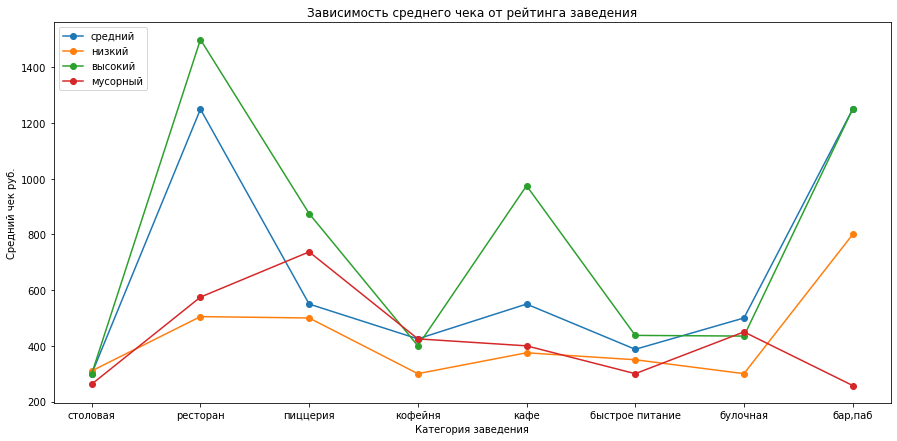

In [37]:
fig, ax = plt.subplots(figsize=(15, 7))

for i in list(data_rating2['chain_category_x'].unique()):
    ax.plot(data_rating2.loc[data_rating2['chain_category_x'] == i]['category'],
            data_rating2.loc[data_rating2['chain_category_x'] == i]['middle_avg_bill'], marker ='o', label=i)
    

plt.ylabel('Средний чек руб.')
plt.xlabel('Категория заведения')
plt.legend(loc='upper left')
plt.title('Зависимость среднего чека от рейтинга заведения')
plt.show()

Посмотрим коррелирует ли цена с рейтингом заведения

In [38]:
print('Коэфициент корреляции Пирсона:' , round(data['rating'].corr(data['middle_avg_bill']), 2))

Коэфициент корреляции Пирсона: 0.24


Посмотрим без заведений с 'мусорным' рейтингом

In [39]:
print('Коэфициент корреляции Пирсона:' , 
      round(data[data['chain_category'] != 'мусорный']['rating'].corr(data[data['chain_category'] != 'мусорный']['middle_avg_bill']),2))

Коэфициент корреляции Пирсона: 0.3


Посмотрим заведений с 'мусорным' рейтингом

In [40]:
print('Коэфициент корреляции Пирсона:' , round(data[data['chain_category'] == 'мусорный']['rating'].corr(data[data['chain_category'] == 'мусорный']['middle_avg_bill']),2))

Коэфициент корреляции Пирсона: -0.39


Наибольший средний чек показывают заведения с высоким рейтингом и средним. 

Мы видим, что  рейтинг заведения и средний чек показывают умеренно положительную корреляцию Пирсона, за исключением заведений с 'мусорным' ретингом, в данном случае ситуация противоположная - показывает умеренно отрицательную корреляцию. Возможно это связано с тем, что покупатель не готов переплачивать за услуги плохого качества, что побуждает, в итоге, занизить оценку заведения.

***Вывод:***


- Самые популярные категории общественного питания - кафе, рестораны и кофейни. Меньше всего столовых и булочных;
- Несетевых заведений общественного питания почти в два раза больше, чем сетевых;
- Чаще всего сетевыми категориями являются кафе, рестораны и кофейни (также они самые популярные и в несетевом формате) в среднем ценовом сегменте;
- В ЦАО на порядок больше, чем в остальных районах. В Северо-западном - меньше всего;
- Большинство топовых улиц по количеству заведений - это улицы с очень большой длинной; 
- Зоны, где находится всего 1 заведение, это маленькие улицы, переулки, проезды, парки и т.д.;
- ЦАО и ЗАО  имеют самый высокий средний чек. Самый низкий средний чек в ЮВАО, СВАО и ВАО.

# 4. Детализируем исследование на открытие кофейни:

<a name="распределение"></a>
**Посмотрим сколько всего кофеен и их распределение на карте**

In [41]:
df = data[data['category'] == 'кофейня']

In [42]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']} {row['middle_coffee_cup']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
df.apply(create_clusters, axis=1)

# выводим карту
m

Всего у нас 1413 кофейни

<a name="круглосуточные"></a>
**Посмотрим, есть ли круглосуточные кофейни**

In [43]:
opening_hours = (df.groupby('hours', as_index = False).agg({'name' : 'count',
                                            'middle_coffee_cup' : 'median',
                                            'rating' : 'median',
                                            'middle_avg_bill' : 'median',
                                            'seats' : 'median'})).sort_values(by='name', ascending = False)

opening_hours['%'] = round(opening_hours['name']/ opening_hours['name'].sum() * 100,2)



In [44]:
fig = px.bar(opening_hours.head(),
             x='name',
             y='hours',
             text=opening_hours['%'].head().apply(lambda x: ('{0:1.2f}%').format(x)),
             title= 'Распределение заведений по категориям')

fig.update_layout(yaxis={'categoryorder':'total ascending'})
fig.update_xaxes(title_text='%')
fig.update_yaxes(title_text='Часы работы')

fig.show() 

Всего 59 кофеен с долей в 4.22%

<a name="рейтинг_фокеен"></a>
**Посмотрим рейтинги кофеен и как они распределяются по районам**

In [45]:
rating_df = df.groupby('district', as_index=False)['rating'].mean()

moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)


# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_df,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный рейтинг заведений по районам',
).add_to(m)

# выводим карту

marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
df.apply(create_clusters, axis=1)



m

In [46]:
df['district'].value_counts()

Центральный административный округ         428
Северный административный округ            193
Северо-Восточный административный округ    159
Западный административный округ            150
Южный административный округ               131
Восточный административный округ           105
Юго-Западный административный округ         96
Юго-Восточный административный округ        89
Северо-Западный административный округ      62
Name: district, dtype: int64

- Больше всего кофеен в ЦАО, все распределены относительно равномерно.
- СЗАО сравнительно малое кол-во кофеен, в районе Митино нет ни одной;
- ЗАО хотя по сравнению с другими округами, имеет отностельно большое кол-во кофеен, в районе Сколково и метро солнцево их нет;
- ВАО сравнительно не большое кол-во кофеен при среднем рейтинге. Нет кофеен в районе метро Лухмановская.

<a name="стоимость_кофе"></a>
**На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?**

In [47]:
df_pivot = (df.pivot_table(index ='district', columns = 'chain_category', values = 'middle_coffee_cup', aggfunc = 'median')).reset_index().sort_values('высокий', ascending = False)

df_pivot

fig = px.bar(df_pivot, 
             x='district', 
             y='высокий',
             color_discrete_sequence=['#85CDFD'],
             title = 'Средняя стоимость чашки кофе')


fig.update_xaxes(title_text='Район')
fig.update_yaxes(title_text='Стоимость чашки кофе')



Хорошим решение выглядит ориентироватся на цену за чашку кофе в кофейнях с хорошим рейтингом и установить в районе 150-170 рублей.

В зависимости от региона мы можем корректировать цену, в ЦАО и ЗАО можем установить цену выше, в ВАО ниже. Однако нужно понимать, что высокая цена, в случае негативного опыта у клиента - моет побудить поставить крайне низкую оценку, что может снизить посещаемость. 

<a name="Вывод"></a>
# 5. Вывод


***Для открытия кофейни можно выбрать один из 3 округов:***
1. СЗАО: 
- сравнительно малое кол-во кофеен, в районе Митино нет ни одной;
- средний чек в районе 750 рублей;
- относительно высокий рейтинг в сравнении с дургими округами.

2. ЗАО 
- хотя по сравнению с другими округами, имеет отностельно большое кол-во кофеен, в районе Сколково и метро Солнцево их нет;
- средний чек в районе 1000 рублей;
- относительно средний рейтинг в сравнении с другими округами.

3. ВАО: 
- сравнительно не большое кол-во кофеен при среднем рейтинге. Нет кофеен в районе метро Лухмановская;
- средний чек в районе 600 рублей;



***Круглосуточных кофеен*** всего 4.22%, что говорит о их невостребованности. 


***Цена за чашку*** можно установить в пределах 150-170 рублей


***Количество посадочных мест*** установить в районе 80.
